#**Assignment 3 - Machine Learning**

###Student: Daniel Dario Fula Arguello - ddfulaa@unal.edu.co
###Student: Carlos Ernesto Isaza Carvajal - ceisazac@unal.edu.co
###Student: Hendrik Eugenio Olaya Castro - heolayac@unal.edu.co

Download the dataset MM-IMDB from https://www.kaggle.com/johnarevalo/datasets.
The dataset includes poster images from movies of different genres as well as the text of thecorresponding synopses.
We will train different multi-label classification models that only use the poster image as input.
The models must be evaluated using the approach of this paper: https://arxiv.org/abs/1702.01992.

##Downloading and Preparing the Data
The database is downloaded and the data to be used for the three models are prepared.

In [ ]:
%%capture
!pip install kaggle


In [ ]:
%%capture
#The appropriate versions of transformers, accelerate and datasets are installed
!pip uninstall accelerate transformers --yes

In [ ]:

%%capture
! pip install transformers==4.28.0

In [ ]:
%%capture
! pip install datasets

In [ ]:
%%capture
!pip install accelerate==0.17.0

In [ ]:
import os
import json
from google.colab import files

#A personal Kaggle token is used to download the database.
uploaded = files.upload()
kaggle_token = json.loads(uploaded["kaggle.json"].decode("utf-8"))

os.environ["KAGGLE_USERNAME"] = kaggle_token["username"]
os.environ["KAGGLE_KEY"] = kaggle_token["key"]
!chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json
chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory


In [ ]:
#Download of the database
!kaggle datasets download -d johnarevalo/raw-mmimdb/mmimdb/dataset 


100% 16.2G/16.2G [03:27<00:00, 91.0MB/s]
100% 16.2G/16.2G [03:27<00:00, 83.7MB/s]


In [ ]:

!unzip raw-mmimdb.zip

Se han truncado las últimas 5000 líneas del flujo de salida.
  inflating: mmimdb/mmimdb/dataset/1785389.jpeg  
  inflating: mmimdb/mmimdb/dataset/1785389.json  
  inflating: mmimdb/mmimdb/dataset/1785612.jpeg  
  inflating: mmimdb/mmimdb/dataset/1785612.json  
  inflating: mmimdb/mmimdb/dataset/1785670.jpeg  
  inflating: mmimdb/mmimdb/dataset/1785670.json  
  inflating: mmimdb/mmimdb/dataset/1786751.jpeg  
  inflating: mmimdb/mmimdb/dataset/1786751.json  
  inflating: mmimdb/mmimdb/dataset/1787067.jpeg  
  inflating: mmimdb/mmimdb/dataset/1787067.json  
  inflating: mmimdb/mmimdb/dataset/1787092.jpeg  
  inflating: mmimdb/mmimdb/dataset/1787092.json  
  inflating: mmimdb/mmimdb/dataset/1787127.jpeg  
  inflating: mmimdb/mmimdb/dataset/1787127.json  
  inflating: mmimdb/mmimdb/dataset/1787660.jpeg  
  inflating: mmimdb/mmimdb/dataset/1787660.json  
  inflating: mmimdb/mmimdb/dataset/1787725.jpeg  
  inflating: mmimdb/mmimdb/dataset/1787725.json  
  inflating: mmimdb/mmimdb/dataset/1787

Unused folders are deleted to free up hard drive space

In [ ]:
import os

import os
import shutil

# Specify the file paths
file_paths = ["/content/raw-mmimdb.zip", "/content/mmimdb/dataset"]

# Loop over the file paths
for file_path in file_paths:
    # Check if the file exists
    if os.path.exists(file_path):
        # If the file is a directory, use shutil.rmtree to remove the directory and its contents
        if os.path.isdir(file_path):
            shutil.rmtree(file_path)
        # If the file is a regular file, use the remove function
        else:
            os.remove(file_path)
        print(f"Deleted the file at path: {file_path}")
    else:
        print(f"No file exists at path: {file_path}")



Deleted the file at path: /content/raw-mmimdb.zip
Deleted the file at path: /content/mmimdb/dataset


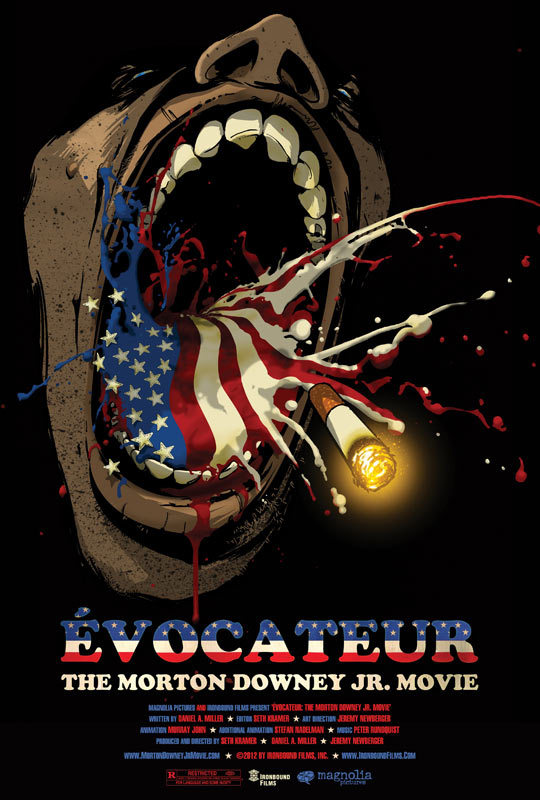

In [ ]:
from PIL import Image
# Sample of a movie poster
image = Image.open('mmimdb/mmimdb/dataset/1822381.jpeg')
image.show()

In [ ]:
import json

# Sample of the JSON file content
with open('mmimdb/mmimdb/dataset/1822381.json', 'r') as f:
    data = json.load(f)

print(data)

{'music department': [{'canonical name': 'Friedlander, Erik', 'name': 'Erik Friedlander', 'long imdb name': 'Erik Friedlander', 'long imdb canonical name': 'Friedlander, Erik'}, {'canonical name': 'Labriola, Art', 'name': 'Art Labriola', 'long imdb name': 'Art Labriola', 'long imdb canonical name': 'Labriola, Art'}, {'canonical name': 'Neill, Ben', 'name': 'Ben Neill', 'long imdb name': 'Ben Neill', 'long imdb canonical name': 'Neill, Ben'}, {'canonical name': 'Rundquist, Corey', 'name': 'Corey Rundquist', 'long imdb name': 'Corey Rundquist', 'long imdb canonical name': 'Rundquist, Corey'}, {'canonical name': 'Rundquist, Peter', 'name': 'Peter Rundquist', 'long imdb name': 'Peter Rundquist', 'long imdb canonical name': 'Rundquist, Peter'}, {'canonical name': 'Rundquist, Peter', 'name': 'Peter Rundquist', 'long imdb name': 'Peter Rundquist', 'long imdb canonical name': 'Rundquist, Peter'}], 'camera and electrical department': [{'canonical name': 'Dodds, Dave', 'name': 'Dave Dodds', 'lon

In [ ]:
# The genres represented by the movie poster are
data["genres"]

['Documentary']

The following code creates the data_structure dictionary that will contain information about the movies to be used in the models. First, it filters the movies that have the desired genres, are in .jpeg format, have RGB mode, and a maximum of 80,000,000 pixels. All these criteria are set to ensure that the models can be trained without errors. Finally, the images are segmented into training, validation, and test sets, ensuring that each genre has at least as many movies as the genre with the lowest frequency. This is done to ensure that all genres have movies in all segments (training, validation, and test).





In [ ]:
import os
import random
import json
from PIL import Image
from collections import defaultdict
from typing import List, Dict
from datasets import Dataset, DatasetDict

# genres_of_interest is a set containing the genres that we are interested in.
genres_of_interest = {'Drama', 'Comedy', 'Romance', 'Thriller', 'Crime', 'Action', 'Adventure', 'Horror',
                      'Documentary', 'Mystery', 'Sci-Fi', 'Fantasy', 'Family', 'Biography', 'War', 'History',
                      'Music', 'Animation', 'Musical', 'Western', 'Sport', 'Short', 'Film-Noir'}

# dataset_dir is the directory path where the datasets are stored.
dataset_dir = 'mmimdb/mmimdb/dataset/'

# json_files is a list of the names of the JSON files in the dataset directory.
json_files = [f for f in os.listdir(dataset_dir) if f.endswith('.json')]

# A seed is set for the random number generator to ensure the reproducibility of the results.
random.seed(15)

# The JSON files are shuffled randomly.
random.shuffle(json_files)

# data_structure is a dictionary that will hold the dataset divided into training, validation, and test sets. 
data_structure = {
    'train': {
        
        'image': [],
        'labels': [],
    },
    'validation': {
        
        'image': [],
        'labels': [],
    },
    'test': {
        
        'image': [],
        'labels': [],
    },
}

# genre_counts is a dictionary that will hold the count of each genre in the dataset.
genre_counts = defaultdict(int)

# preliminary_data is a list that will hold tuples of image file paths, image objects, and their corresponding genre labels.
preliminary_data = []

# The JSON files are opened and read one by one.
for file in json_files:
    with open(dataset_dir + file, 'r') as f:
        data = json.load(f)
    # If the genres in the file are a subset of genres_of_interest, the image associated with the file is opened and its details are stored.
    if set(data["genres"]).issubset(genres_of_interest):
        image_file_path = dataset_dir + file.replace('.json', '.jpeg')
        if image_file_path.lower().endswith('.jpeg'):
            image = Image.open(image_file_path)
            if image.mode == "RGB":
                if image.size[0]*image.size[1] <= 80000000:
                    # The count for each genre in the movie is increased.
                    for genre in data["genres"]:  
                        genre_counts[genre] += 1
                    # The image file path, image object, and genre labels are stored in preliminary_data for later use.
                    preliminary_data.append((image_file_path, image, data["genres"]))
                    

# The count of the least common genre is calculated.
least_genre_count = min(genre_counts.values())

# genre_counts is reset for the next part of the code.
genre_counts = defaultdict(int)

# The images and their labels are processed again, this time to balance the distribution of genres across the train, validation, and test sets.
for _,image, genres in preliminary_data:
    least_genre = min(genres, key=lambda g: genre_counts[g])
    if genre_counts[least_genre] < least_genre_count:  
        for genre in genres:
            genre_counts[genre] += 1
        if genre_counts[least_genre] <= 0.7 * least_genre_count:
            split = 'train'
        elif genre_counts[least_genre] <= 0.85 * least_genre_count:
            split = 'validation'
        else:
            split = 'test'
        
        data_structure[split]['image'].append(image)
        data_structure[split]['labels'].append(genres)

# The processed data is stored in dataset_dict as a DatasetDict object.
dataset_dict = DatasetDict({
    'train': Dataset.from_dict(data_structure['train']),
    'validation': Dataset.from_dict(data_structure['validation']),
    'test': Dataset.from_dict(data_structure['test']),
})


print(dataset_dict)


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:2918: DecompressionBombWarning: Image size (101769871 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:2918: DecompressionBombWarning: Image size (99083998 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:2918: DecompressionBombWarning: Image size (100419400 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:2918: DecompressionBombWarning: Image size (97200000 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:2918: DecompressionBombWarning: Image size (99331758 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DO

DatasetDict({
    train: Dataset({
        features: ['image', 'labels'],
        num_rows: 3274
    })
    validation: Dataset({
        features: ['image', 'labels'],
        num_rows: 687
    })
    test: Dataset({
        features: ['image', 'labels'],
        num_rows: 699
    })
})


In [ ]:
#The information available for any given movie in dataset_dict is visualized.
dataset_dict['train'][1000]

{'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=327x475 at 0x7F6615847610>,
 'labels': ['Adventure', 'Drama', 'Family']}

The number of movies for each genre is visualized in the splits.

In [ ]:
import pandas as pd
import numpy as np
from collections import Counter

# Initialize the counter dictionary for each dataset
counters = {
    "train": Counter(),
    "validation": Counter(),
    "test": Counter()
}

# For each dataset ('train', 'validation', 'test')
for dataset_name in dataset_dict.keys():
    # For each sample in the dataset
    for labels in dataset_dict[dataset_name]['labels']:
        # Increment the counter for each genre in the sample
        counters[dataset_name].update(labels)

# Convert the counters to a Pandas DataFrame
df = pd.DataFrame(counters)

# Add a 'total' column that is the sum of the other columns
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the 'total' column in descending order
df = df.sort_values('total', ascending=False)

df



,train,validation,test,total
Drama,1589,317,345,2251
Comedy,925,206,199,1330
Romance,629,141,135,905
Thriller,619,126,139,884
Crime,528,97,111,736
Action,453,79,96,628
Adventure,443,89,94,626
Family,358,79,81,518
Documentary,343,79,78,500
Fantasy,321,60,69,450


For some genree, a movie poster is displayed. This allows us to familiarize ourselves with the data we are working with.

Filter:   0%|          | 0/3274 [00:00<?, ? examples/s]

Filter:   0%|          | 0/3274 [00:00<?, ? examples/s]

Filter:   0%|          | 0/3274 [00:00<?, ? examples/s]

Filter:   0%|          | 0/3274 [00:00<?, ? examples/s]

Filter:   0%|          | 0/3274 [00:00<?, ? examples/s]

Filter:   0%|          | 0/3274 [00:00<?, ? examples/s]

Filter:   0%|          | 0/3274 [00:00<?, ? examples/s]

Filter:   0%|          | 0/3274 [00:00<?, ? examples/s]

Filter:   0%|          | 0/3274 [00:00<?, ? examples/s]

Filter:   0%|          | 0/3274 [00:00<?, ? examples/s]

Filter:   0%|          | 0/3274 [00:00<?, ? examples/s]

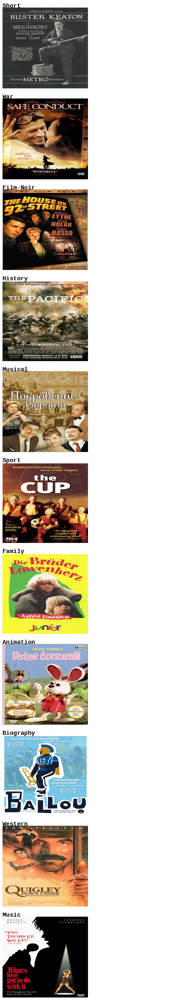

In [ ]:
from PIL import ImageDraw, ImageFont, Image
import random

def show_examples(dataset_dict, genres_of_interest, seed: int = 1234, examples_per_class: int = 1, size=(350, 350), margin=10):
    w, h = size
    grid = Image.new('RGB', size=((examples_per_class+1) * (w+margin), len(genres_of_interest) * (h+margin)), color=(255, 255, 255))
    draw = ImageDraw.Draw(grid)
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationMono-Bold.ttf", 24)

    for label_id, genre in enumerate(genres_of_interest):
        ds_slice = dataset_dict['train'].filter(lambda ex: genre in ex['labels']).shuffle(seed).select(range(examples_per_class))

        for i, example in enumerate(ds_slice):
            image = example['image']
            idx = examples_per_class * label_id + i
            text_position = ((idx % examples_per_class * (w+margin) + margin), (idx // examples_per_class * (h+margin) + margin))
            draw.text(text_position, f"{genre}", (0, 0, 0), font=font)

            box = (text_position[0], text_position[1] + font.getsize(f"{genre}")[1])
            image = image.resize((w-margin, h-margin-font.getsize(f"{genre}")[1]))
            grid.paste(image, box=box)

    return grid

selected_genres = {'Family', 'Biography', 'War', 'History',
                      'Music', 'Animation', 'Musical', 'Western', 'Sport', 'Short', 'Film-Noir'}
show_examples(dataset_dict, selected_genres, seed=random.randint(0, 1337), examples_per_class=1)

##1. Fine tune a Visual Transformer model
Follow the instructions in this blog post: https://huggingface.co/blog/fine-tune-vit
to train a multi-label annotation model over the MM-IMDB training dataset. Report the
results on the test dataset.

In this part of the notebook, we implement the image preparation for processing using the ViTFeatureExtractor from the transformers library. This extractor is responsible for adjusting the images to fit the Vision Transformer (ViT) model. We are using a pretrained model by Google, with a configuration that processes images in 16x16 patches and was trained on a dataset with around 21,000 classes. By using this pretrained extractor, we ensure that the image preparation is suitable for the ViT model.

In [ ]:
from transformers import ViTFeatureExtractor

model_name_or_path = 'google/vit-base-patch16-224-in21k'
feature_extractor = ViTFeatureExtractor.from_pretrained(model_name_or_path)

/usr/local/lib/python3.10/dist-packages/transformers/models/vit/feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(


The Vision Transformer (ViT) feature extractor primarily prepares images for processing by adjusting their dimensions and pixel values. The most crucial parameters include do_resize, do_rescale, and do_normalize that control image resizing, rescaling, and normalization respectively. With a designated size of 224x224 pixels, and normalization parameters (mean and standard deviation) set to 0.5, the images are prepared to fit the model's requirements. The rescale factor, approximately 1/255, ensures pixel values fall within the [0,1] range, enhancing the model's performance.

In [ ]:
feature_extractor

ViTFeatureExtractor {
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.5,
    0.5,
    0.5
  ],
  "image_processor_type": "ViTFeatureExtractor",
  "image_std": [
    0.5,
    0.5,
    0.5
  ],
  "resample": 2,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "height": 224,
    "width": 224
  }
}

In [ ]:
#the transformation of an image is visualized
feature_extractor(image, return_tensors='pt')

{'pixel_values': tensor([[[[ 0.1922,  0.4588,  0.5451,  ...,  0.4824,  0.4275,  0.2157],
          [ 0.3255,  0.7333,  0.7490,  ...,  0.6627,  0.5686,  0.2941],
          [ 0.3804,  0.7647,  0.8510,  ...,  0.7569,  0.6000,  0.3176],
          ...,
          [ 0.0588,  0.2392,  0.2392,  ...,  0.2078,  0.2000,  0.0275],
          [ 0.0588,  0.2863,  0.2392,  ...,  0.1451, -0.0745, -0.1529],
          [ 0.0431,  0.2157,  0.1608,  ..., -0.0196, -0.2314, -0.1686]],

         [[ 0.0510,  0.2549,  0.2627,  ...,  0.0980,  0.1216, -0.0667],
          [ 0.0980,  0.4431,  0.3882,  ...,  0.1922,  0.2314, -0.0039],
          [ 0.0667,  0.3961,  0.3961,  ...,  0.2000,  0.2235, -0.0118],
          ...,
          [ 0.0980,  0.2706,  0.2471,  ...,  0.2706,  0.2235,  0.0431],
          [ 0.0980,  0.3098,  0.2549,  ...,  0.2078, -0.0588, -0.1451],
          [ 0.0745,  0.2392,  0.1765,  ...,  0.0431, -0.2235, -0.1608]],

         [[-0.2157, -0.0745, -0.1686,  ..., -0.5608, -0.5608, -0.3882],
          [-0

The prepared_dataset_dict dictionary is created to store the preprocessed images along with their labels.

In [ ]:
def transform(example_batch):
    # Take a list of PIL images and turn them to pixel values
    inputs = feature_extractor([x for x in example_batch['image']], return_tensors='pt')

    # Don't forget to include the labels!
    inputs['labels'] = example_batch['labels']
    return inputs

prepared_dataset_dict = dataset_dict.with_transform(transform)


In [ ]:
#A portion of prepared_dataset_dict is visualized to verify its shape.
prepared_dataset_dict['train'][500:502]

{'pixel_values': tensor([[[[-0.9922, -0.9922, -0.9922,  ..., -0.9922, -0.9922, -0.9922],
          [-0.9922, -0.9922, -0.9922,  ..., -1.0000, -1.0000, -0.9922],
          [-0.9922, -0.9922, -0.9922,  ..., -0.9922, -1.0000, -1.0000],
          ...,
          [-1.0000, -1.0000, -1.0000,  ..., -0.9922, -0.9922, -0.9922],
          [-1.0000, -1.0000, -1.0000,  ..., -1.0000, -0.9922, -0.9922],
          [-0.9922, -0.9922, -1.0000,  ..., -0.9922, -1.0000, -1.0000]],

         [[-0.9922, -0.9922, -0.9922,  ..., -0.9843, -0.9843, -0.9843],
          [-0.9922, -0.9922, -0.9922,  ..., -0.9922, -0.9922, -0.9843],
          [-0.9922, -0.9922, -0.9922,  ..., -0.9843, -0.9922, -0.9922],
          ...,
          [-1.0000, -1.0000, -1.0000,  ..., -0.9922, -0.9922, -0.9922],
          [-1.0000, -1.0000, -1.0000,  ..., -1.0000, -0.9922, -0.9922],
          [-0.9922, -0.9922, -1.0000,  ..., -0.9922, -1.0000, -1.0000]],

         [[-0.9765, -0.9765, -0.9765,  ..., -0.9529, -0.9529, -0.9529],
          [-0

In [ ]:
import torch

def collate_fn(batch):
    """
    This function is used to process a batch of data. 

    Args:
        batch (list): A list of dictionary objects where each object has 'pixel_values' and 'labels'.
    
    Returns:
        dict: A dictionary with keys 'pixel_values' and 'labels'. 
              The 'pixel_values' is a tensor that is a stack of all the image tensors in the batch. 
              The 'labels' is a tensor that is a stack of all the one-hot encoded label tensors in the batch.
    """
    
    # Initialize an empty list to store the label tensors
    labels_list = []

    # Loop over each example in the batch
    for x in batch:

        # Initialize a tensor with zeros. The size of this tensor is equal to the number of genres.
        labels = torch.zeros(len(genres_of_interest))

        # Loop over the labels in the current example
        for label in x['labels']:

            # Get the index of the current label in the list of all genres
            index = list(genres_of_interest).index(label)

            # Set the corresponding index in the label tensor to 1. This is a way of representing the labels in a one-hot encoded format.
            labels[index] = 1

        # Append the one-hot encoded label tensor to the labels_list
        labels_list.append(labels)

    # Return a dictionary with two tensors: 'pixel_values' and 'labels'. 
    return {
        'pixel_values': torch.stack([x['pixel_values'] for x in batch]),
        'labels': torch.stack(labels_list)
    }



In [ ]:
from sklearn.metrics import f1_score
#loss function
def compute_metrics(p):
    """
    This function computes the F1-score for a given set of predictions and actual labels.
    
    Args:
        p (EvalPrediction): An EvalPrediction object which contains predictions and labels.

    Returns:
        dict: A dictionary with the F1-score under the key 'f1'.
    """

    # Set the threshold to consider for a prediction to be classified as a positive class.
    preds = (p.predictions > 0.7).astype(int)

    # The actual labels.
    labels = p.label_ids

    # If the predictions or labels arrays are not 1D, flatten them.
    if preds.ndim > 1:
        preds = np.concatenate(preds)
    if labels.ndim > 1:
        labels = np.concatenate(labels)

    # Compute and return the F1 score. 
    return {"f1": f1_score(labels, preds, average="macro")}




Initialize the pre-trained Vision Transformer (ViT) model for image classification.  The model is loaded with the specified pre-trained weights and is set to have a number of output units equal to the number of unique labels in the dataset. The id2label and label2id parameters are dictionaries for mapping the numerical class  identifiers to their respective textual labels, and vice versa.

In [ ]:
from transformers import ViTForImageClassification

# Define the list of all possible labels
labels = list(genres_of_interest)


model = ViTForImageClassification.from_pretrained(
    model_name_or_path,
    num_labels=len(labels),
    id2label={i: label for i, label in enumerate(labels)},  # Mapping from label index to label name
    label2id={label: i for i, label in enumerate(labels)}   # Mapping from label name to label index
)


Some weights of the model checkpoint at google/vit-base-patch16-224-in21k were not used when initializing ViTForImageClassification: ['pooler.dense.weight', 'pooler.dense.bias']
- This IS expected if you are initializing ViTForImageClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing ViTForImageClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In the next code, the TrainingArguments class from the Transformers library is used to set the parameters for the training process. These parameters include the output directory, batch size, evaluation strategy, the number of epochs, the mixed precision training mode, steps for saving and evaluating the model, the learning rate, checkpoint limit, and whether to remove unused columns or not. It also includes the option to push the model to Hugging Face's model hub after training, specify where to report the training metrics, and whether to load the best model when resuming training.

In [ ]:
from transformers import TrainingArguments

training_args = TrainingArguments(
  output_dir="./vit-base-beans-demo-v5",
  per_device_train_batch_size=32,
  evaluation_strategy="steps",
  num_train_epochs=4,
  fp16=True,#Set it to "True" when successfully connected to a GPU.
  save_steps=50,
  eval_steps=50,
  logging_steps=10,
  learning_rate=2e-4,
  save_total_limit=2,
  remove_unused_columns=False,
  push_to_hub=False,
  report_to='tensorboard',
  load_best_model_at_end=True,
)

Below is created instantiate a Trainer object. The Trainer is responsible for managing and orchestrating the entire training process. It handles the training loop, evaluation, prediction, and saving of the model.

In [ ]:
from transformers import Trainer

trainer = Trainer(
    model=model,
    args=training_args,
    data_collator=collate_fn,
    compute_metrics=compute_metrics,
    train_dataset=prepared_dataset_dict["train"],
    eval_dataset=prepared_dataset_dict["validation"],
    tokenizer=feature_extractor
)

The model is then trained, noting that the loss function was configured with a threshold of 0.7. This was done to force the model to learn, as with a threshold of 0.5, the F1 score at each step remained consistently above 0.9. Different configurations were also tested for the "average" parameter, and using "macro" yielded better results.

In [ ]:
# The model is trained
train_results = trainer.train()


/usr/local/lib/python3.10/dist-packages/transformers/optimization.py:391: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Step,Training Loss,Validation Loss,F1
50,0.373700,0.367513,0.465593
100,0.352900,0.349469,0.465593
150,0.340500,0.340474,0.465593
200,0.330100,0.331553,0.496448
250,0.313500,0.325086,0.511318
300,0.302300,0.321299,0.522276
350,0.286100,0.319820,0.530595
400,0.276700,0.318300,0.533845


In [ ]:
trainer.save_model()
trainer.log_metrics("train", train_results.metrics)
trainer.save_metrics("train", train_results.metrics)
trainer.save_state()

***** train metrics *****
  epoch                    =         4.0
  total_flos               = 932901141GF
  train_loss               =      0.3313
  train_runtime            =  0:14:33.57
  train_samples_per_second =      14.794
  train_steps_per_second   =       0.462


The model predictions are first calculated using the prediction method of the trainer instance. Then, these raw prediction scores are transformed into probabilities using the softmax function. The actual labels are also obtained from the test set. A sanity check is performed to ensure that the predicted probabilities and the actual labels have the same shape. Finally, for some example movies, the script prints the true labels and the predicted probabilities for each label. It is observed that the probabilities for the true genres are very low, although possibly higher than the others.

In [ ]:
import torch

# Compute the predictions on the test dataset
test_predictions = trainer.predict(prepared_dataset_dict["test"])

# Apply the softmax function to get probabilities from the predictions
probabilities = torch.nn.functional.softmax(torch.from_numpy(test_predictions.predictions.astype(np.float32)), dim=-1)

# Get the actual labels in binary format
true_labels = test_predictions.label_ids

# Ensure that `true_labels` and `probabilities` have the same shape
assert true_labels.shape == probabilities.shape

# Now, for a few movies, you can display the true labels and probabilities for each label:
num_examples_to_show = 5
for i in range(num_examples_to_show):
    print(f"Movie {i + 1}:")
    print("True labels: ", [labels[j] for j in range(len(labels)) if true_labels[i, j] == 1])
    print("Label probabilities: ", {labels[j]: probabilities[i, j].item() for j in range(len(labels))})
    print()




Movie 1:
True labels:  ['Drama']
Label probabilities:  {'Western': 0.015416448004543781, 'History': 0.0223433505743742, 'Short': 0.009241611696779728, 'Film-Noir': 0.01716473512351513, 'Crime': 0.0491851270198822, 'Comedy': 0.03467371687293053, 'Musical': 0.013315791264176369, 'Romance': 0.04018295183777809, 'Sport': 0.019223589450120926, 'Animation': 0.007085789460688829, 'Thriller': 0.14795522391796112, 'War': 0.02332434244453907, 'Sci-Fi': 0.029949048534035683, 'Action': 0.083912193775177, 'Mystery': 0.03337796777486801, 'Adventure': 0.0343703031539917, 'Family': 0.009934185072779655, 'Documentary': 0.014341671019792557, 'Biography': 0.024491488933563232, 'Fantasy': 0.02199695073068142, 'Horror': 0.042816322296857834, 'Drama': 0.28770875930786133, 'Music': 0.01798848807811737}

Movie 2:
True labels:  ['Drama']
Label probabilities:  {'Western': 0.0128860492259264, 'History': 0.016194326803088188, 'Short': 0.007172166369855404, 'Film-Noir': 0.024144943803548813, 'Crime': 0.05608388036

Now top_labels_predicted is created, is a list of lists, where each inner list contains the top-k predicted labels for each entry in the test set, where k is the number of true labels for that entry.


In [ ]:
from torch import topk

# Listing the labels and their indices for reference
label2id = model.config.label2id
id2label = model.config.id2label

top_labels_predicted = []

# For each entry in the test set
for i, entry in enumerate(prepared_dataset_dict["test"]):
    # Get the true labels
    true_labels = entry['labels']
    num_true_labels = len(true_labels)

    # Get the top-k probabilities and their indices
    top_probs, top_indices = topk(probabilities[i], num_true_labels)

    # Convert the indices to labels
    top_labels = [id2label[idx.item()] for idx in top_indices]

    # Append to the list of predicted labels
    top_labels_predicted.append(top_labels)





A few movies are selected to display their posters along with their true labels and predicted labels. This gives us an idea of how the model is performing.

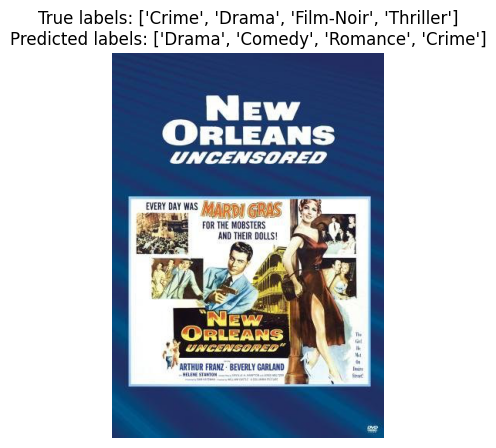

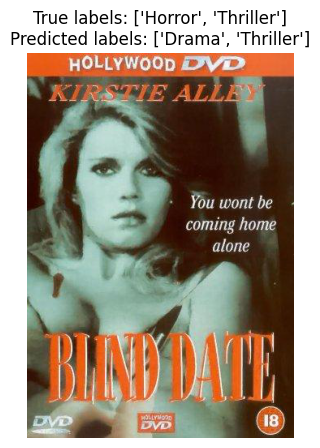

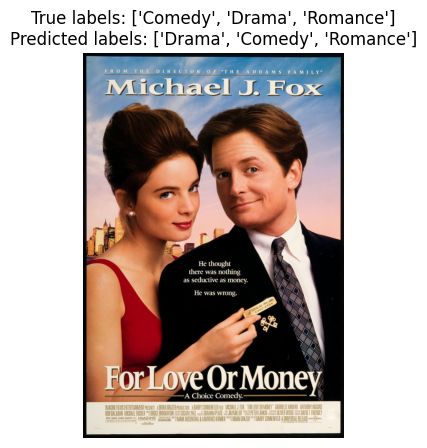

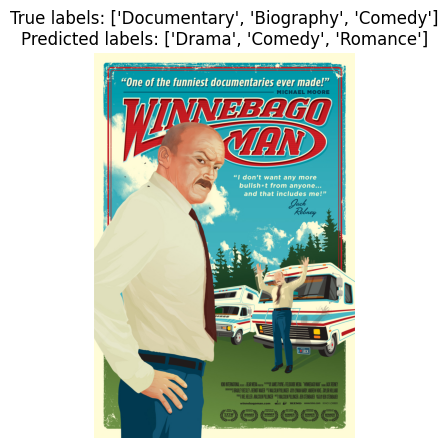

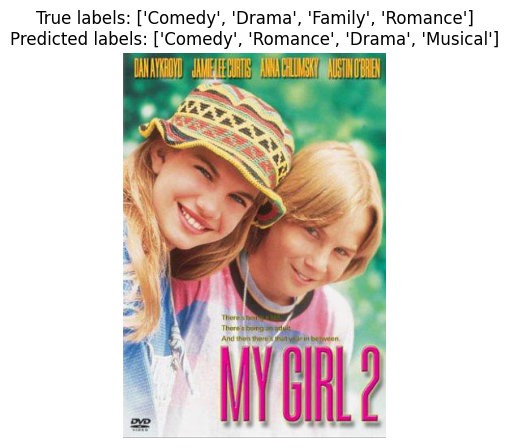

...

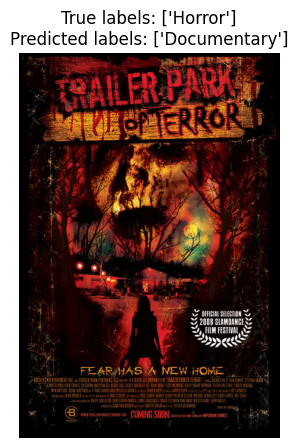

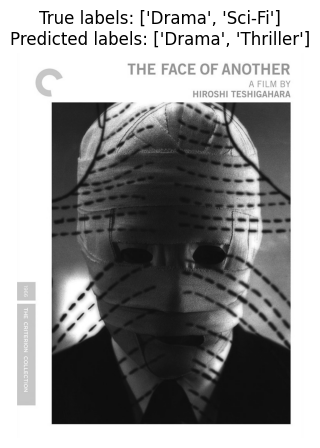

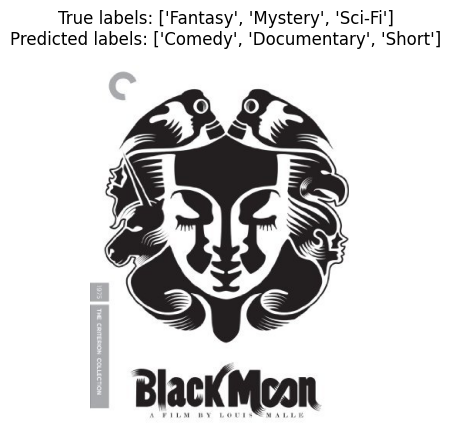

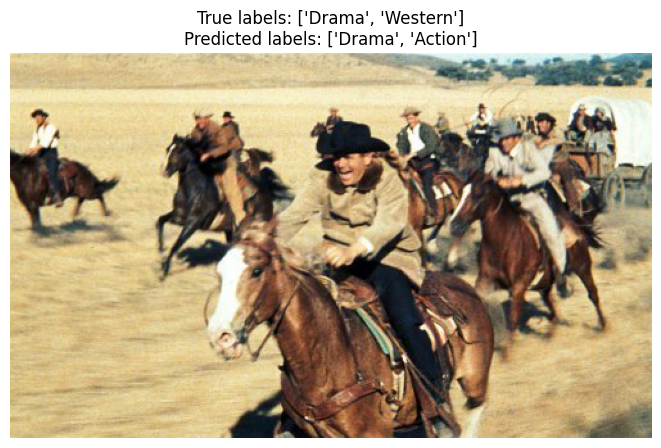

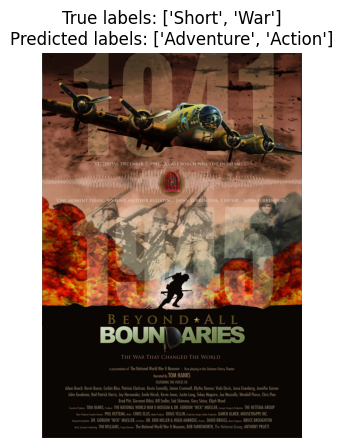

In [ ]:
import random
from PIL import Image
import matplotlib.pyplot as plt

# Select a few random indices
random_indices = random.sample(range(len(dataset_dict["test"])), 5)

# For each randomly selected index
for i in random_indices:
    # Get the corresponding test entry
    entry = dataset_dict["test"][i]

    # Load the original image from the file path
    image = Image.open(entry['image_file_path'])

    # Get the true labels
    true_labels = entry['labels']

    # Get the predicted labels
    predicted_labels = top_labels_predicted[i]

    # Display the image with the true labels and the predicted labels
    plt.figure(figsize=(10, 5))
    plt.imshow(image)
    plt.title(f"True labels: {true_labels}\nPredicted labels: {predicted_labels}")
    plt.axis('off')
    plt.show()





In [ ]:
from sklearn.preprocessing import MultiLabelBinarizer

# Initialize the MultiLabelBinarizer
mlb = MultiLabelBinarizer()

# Convert the true labels into binary format
y_true = mlb.fit_transform([entry['labels'] for entry in dataset_dict["test"]])

# Convert the predicted labels into binary format
y_pred = mlb.transform(top_labels_predicted)

# Calculate F1 scores
f1_sample = f1_score(y_true, y_pred, average='samples')
f1_macro = f1_score(y_true, y_pred, average='macro')
f1_weighted = f1_score(y_true, y_pred, average='weighted')
f1_micro = f1_score(y_true, y_pred, average='micro')

# Print F1 scores
print("F1 score (samples_clip):", f1_sample)
print("F1 score (macro_clip):", f1_macro)
print("F1 score (weighted_clip):", f1_weighted)
print("F1 score (micro_clip):", f1_micro)


F1 score (samples_clip): 0.430932030932031
F1 score (macro_clip): 0.2935717107600043
F1 score (weighted_clip): 0.400104294151728
F1 score (micro_clip): 0.4646317829457364


In [ ]:
import pandas as pd
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score

# Initialize the lists that will hold the scores
f1_scores = []
precision_scores = []
recall_scores = []
error_rate_scores = []
accuracy_scores = []

# Obtain the list of genres
genres = mlb.classes_

for i, genre in enumerate(genres):
    y_true_genre = y_true[:, i]
    y_pred_genre = y_pred[:, i]
    
    f1 = f1_score(y_true_genre, y_pred_genre)
    precision = precision_score(y_true_genre, y_pred_genre)
    recall = recall_score(y_true_genre, y_pred_genre)
    error_rate = 1 - precision  # Error rate is 1 minus the precision
    accuracy=accuracy_score(y_true_genre, y_pred_genre)
    # Add the scores to their respective lists
    f1_scores.append(f1)
    precision_scores.append(precision)
    recall_scores.append(recall)
    error_rate_scores.append(error_rate)
    accuracy_scores.append(accuracy)
# Create the DataFrame
df = pd.DataFrame({
    'Genre': genres,
    'F1': f1_scores,
    'Precision': precision_scores,
    'Recall': recall_scores,
    'Error Rate': error_rate_scores,
    'Accuracy': accuracy_scores
})

# Sort the DataFrame by F1 score in descending order
df = df.sort_values(by='F1', ascending=False)

df


,Genre,F1,Precision,Recall,Error Rate,Accuracy
7,Drama,0.695270,0.559292,0.918605,0.440708,0.605413
2,Animation,0.650000,0.709091,0.600000,0.290909,0.940171
4,Comedy,0.587571,0.465672,0.795918,0.534328,0.688034
8,Family,0.576923,0.633803,0.529412,0.366197,0.905983
5,Crime,0.531532,0.508621,0.556604,0.491379,0.851852
16,Romance,0.486339,0.417840,0.581699,0.582160,0.732194
20,Thriller,0.479290,0.373272,0.669421,0.626728,0.749288
0,Action,0.438776,0.443299,0.434343,0.556701,0.843305
9,Fantasy,0.418182,0.534884,0.343284,0.465116,0.908832
1,Adventure,0.388060,0.333333,0.464286,0.666667,0.824786


##2. Fine tune a ConvNeXT model
The model can be found in https://huggingface.co/docs/transformers/model_doc/convnext.
Fine tune it as a multi-label annotation model over the MM-IMDB training dataset. Report
the results on the test dataset.

In this code block, we are initializing the Convolutional Neural Networks with Transformers (ConvNet) model for image classification tasks. Firstly, we define the model's path, which is the identifier of the pre-trained ConvNet model we are going to use, in this case, 'facebook/convnext-large-224', a large ConvNet model pre-trained by Facebook with 224 classes. Next, we create an instance of the ConvNet feature extractor using the ConvNextFeatureExtractor.from_pretrained() method from the Hugging Face Transformers library, which is responsible for preprocessing the image data to feed it into the ConvNet model.

In [ ]:
from transformers import ConvNextFeatureExtractor, ConvNextForImageClassification
import torch

# Initialize the feature extractor.
model_path1= "facebook/convnext-large-224"
feature_extractor1 = ConvNextFeatureExtractor.from_pretrained(model_path1)



/usr/local/lib/python3.10/dist-packages/transformers/models/convnext/feature_extraction_convnext.py:28: FutureWarning: The class ConvNextFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ConvNextImageProcessor instead.
  warnings.warn(


The ConvNextFeatureExtractor and the ViTFeatureExtractor are two different approaches to image processing. Both perform common operations such as normalization, resizing, and scaling on input images. However, the ConvNextFeatureExtractor offers additional parameters, such as the option to crop a percentage of the image and specify the shortest edge size. On the other hand, the ViTFeatureExtractor defines the image size using separate parameters for height and width. There are also differences in the mean and standard deviation values used for image normalization. In summary, both feature extractors serve the purpose of image processing, but the ConvNextFeatureExtractor provides more flexibility with cropping options and a more precise definition of the image size.

In [ ]:
feature_extractor1

ConvNextFeatureExtractor {
  "crop_pct": 0.875,
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "feature_extractor_type": "ConvNextFeatureExtractor",
  "image_mean": [
    0.485,
    0.456,
    0.406
  ],
  "image_processor_type": "ConvNextFeatureExtractor",
  "image_std": [
    0.229,
    0.224,
    0.225
  ],
  "resample": 3,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "shortest_edge": 224
  }
}

In [ ]:
from torchvision.transforms import (
    CenterCrop,
    Compose,
    Normalize,
    RandomHorizontalFlip,
    RandomResizedCrop,
    Resize,
    ToTensor,
)

# La media y desviación estándar para ConvNext
normalize = Normalize(mean=feature_extractor1.image_mean, std=feature_extractor1.image_std)

# Establece el tamaño para ConvNext
shortest_edge = feature_extractor1.size["shortest_edge"]
crop_size = (shortest_edge, shortest_edge)

# Define las transformaciones de las imágenes
train_transforms = Compose(
    [
        RandomResizedCrop(crop_size),
        RandomHorizontalFlip(),
        ToTensor(),
        normalize,
    ]
)

val_transforms = Compose(
    [
        Resize((shortest_edge, shortest_edge)),
        CenterCrop(crop_size),
        ToTensor(),
        normalize,
    ]
)

# Funciones de preprocesamiento
def preprocess_train(example_batch):
    """Apply train_transforms across a batch."""
    example_batch["pixel_values"] = [
        train_transforms(image) for image in example_batch["image"]
    ]
    return example_batch

def preprocess_val(example_batch):
    """Apply val_transforms across a batch."""
    example_batch["pixel_values"] = [
        val_transforms(image) for image in example_batch["image"]
    ]
    return example_batch


In [ ]:
dataset_dict1=dataset_dict
batch_size = 100
dataset_dict1['train'] = dataset_dict1['train'].map(preprocess_train, batched=True, batch_size=batch_size)

Map:   0%|          | 0/3231 [00:00<?, ? examples/s]

In [ ]:
dataset_dict1['validation'] = dataset_dict1['validation'].map(preprocess_val, batched=True, batch_size=batch_size)



Map:   0%|          | 0/678 [00:00<?, ? examples/s]

In [ ]:
dataset_dict1['test'] = dataset_dict1['test'].map(preprocess_val, batched=True, batch_size=batch_size)

Map:   0%|          | 0/702 [00:00<?, ? examples/s]

In [ ]:
import numpy as np
from sklearn.metrics import f1_score

def collate_fn(batch):
    labels_list = []
    for x in batch:
        labels = torch.zeros(len(genres_of_interest))
        for label in x['labels']:
            index = list(genres_of_interest).index(label)
            labels[index] = 1
        labels_list.append(labels)

    return {
        #'pixel_values': torch.stack([x['pixel_values'] for x in batch]),
        'pixel_values': torch.stack([torch.tensor(x['pixel_values']) for x in batch]),
        'labels': torch.stack(labels_list)
    }

def compute_metrics(p):
    preds = (p.predictions > 0.7).astype(int)
    labels = p.label_ids

    if preds.ndim > 1:
        preds = np.concatenate(preds)
    if labels.ndim > 1:
        labels = np.concatenate(labels)

    return {"f1": f1_score(labels, preds, average="macro")}


In [ ]:
from transformers import  TrainingArguments, Trainer

# Lista de todas las posibles etiquetas
labels = list(genres_of_interest)

model = ConvNextForImageClassification.from_pretrained(
    model_path1,
    num_labels=len(labels),
    id2label={i: label for i, label in enumerate(labels)},
    label2id={label: i for i, label in enumerate(labels)},
    ignore_mismatched_sizes = True,
)

training_args = TrainingArguments(
    fp16=True,#poner en true cuando se use GPU
    output_dir="./ConvNeXt-GenreClassifier",
    
    per_device_train_batch_size=32,  # tamaño del lote por dispositivo durante el entrenamiento
    per_device_eval_batch_size=32, 
    evaluation_strategy="steps",
    num_train_epochs=4,
    save_steps=50,
    eval_steps=50,
    logging_steps=10,
    learning_rate=2e-4,
    save_total_limit=2,
    remove_unused_columns=False,
    load_best_model_at_end=True,
)

trainer = Trainer(
    model=model,
    args=training_args,
    data_collator=collate_fn,
    compute_metrics=compute_metrics,
    train_dataset=dataset_dict1["train"],
    eval_dataset=dataset_dict1["validation"],
    tokenizer=feature_extractor1
)




Some weights of ConvNextForImageClassification were not initialized from the model checkpoint at facebook/convnext-large-224 and are newly initialized because the shapes did not match:
- classifier.weight: found shape torch.Size([1000, 1536]) in the checkpoint and torch.Size([23, 1536]) in the model instantiated
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([23]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
train_results = trainer.train()

/usr/local/lib/python3.10/dist-packages/transformers/optimization.py:391: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Step,Training Loss,Validation Loss,F1
50,0.358500,0.357705,0.465593
100,0.352300,0.349406,0.465593
150,0.340600,0.341390,0.466620
200,0.331000,0.332547,0.468668
250,0.310100,0.324894,0.493476
300,0.302300,0.321151,0.506963
350,0.284800,0.320858,0.530749
400,0.276700,0.318855,0.530110


In [ ]:
import torch

# Calcular las predicciones en el conjunto de datos de prueba|
test_predictions = trainer.predict(dataset_dict1["test"])

# Aplicar la función softmax para obtener probabilidades
probabilities = torch.nn.functional.softmax(torch.from_numpy(test_predictions.predictions.astype(np.float32)), dim=-1)
# Obtén las etiquetas reales en el formato binario
true_labels = test_predictions.label_ids

# Asegúrate de que `true_labels` y `probabilities` tengan la misma forma
assert true_labels.shape == probabilities.shape

# Ahora, para unas cuantas películas, puedes mostrar las etiquetas verdaderas y las probabilidades para cada etiqueta:
num_examples_to_show = 5
for i in range(num_examples_to_show):
    print(f"Movie {i + 1}:")
    print("True labels: ", [labels[j] for j in range(len(labels)) if true_labels[i, j] == 1])
    print("Label probabilities: ", {labels[j]: probabilities[i, j].item() for j in range(len(labels))})
    print()



Movie 1:
True labels:  ['Drama']
Label probabilities:  {'Drama': 0.5063468217849731, 'Animation': 0.0015711867017671466, 'Crime': 0.0799984335899353, 'Music': 0.011121302843093872, 'Biography': 0.01884422078728676, 'Film-Noir': 0.03802921250462532, 'Documentary': 0.007510367315262556, 'Fantasy': 0.0050127641297876835, 'Sci-Fi': 0.0066668251529335976, 'Adventure': 0.00886667612940073, 'Comedy': 0.025606514886021614, 'History': 0.013520066626369953, 'Horror': 0.008593876846134663, 'Sport': 0.014590153470635414, 'Short': 0.004493412561714649, 'Family': 0.0029526131693273783, 'Action': 0.02073678933084011, 'Romance': 0.0686940997838974, 'Western': 0.014590153470635414, 'Mystery': 0.031867824494838715, 'Thriller': 0.08486731350421906, 'Musical': 0.008627512492239475, 'War': 0.016891848295927048}

Movie 2:
True labels:  ['Drama']
Label probabilities:  {'Drama': 0.5722588896751404, 'Animation': 0.0017076844815164804, 'Crime': 0.059846263378858566, 'Music': 0.01284194178879261, 'Biography': 0.

In [ ]:
from torch import topk
# Listar las etiquetas y sus índices para referencia
label2id = model.config.label2id
id2label = model.config.id2label

top_labels_predicted = []

# Para cada entrada en el conjunto de prueba
for i, entry in enumerate(dataset_dict1["test"]):
    # Obtener las etiquetas verdaderas
    true_labels = entry['labels']
    num_true_labels = len(true_labels)

    # Obtener las top-k probabilidades y sus índices
    top_probs, top_indices = topk(probabilities[i], num_true_labels)

    # Convertir los índices a etiquetas
    top_labels = [id2label[idx.item()] for idx in top_indices]

    # Agregar a la lista de etiquetas predichas
    top_labels_predicted.append(top_labels)

# Ahora, top_labels_predicted es una lista de listas, donde cada lista interna contiene las top-k etiquetas predichas
# para cada entrada en el conjunto de prueba, donde k es el número de etiquetas verdaderas para esa entrada.

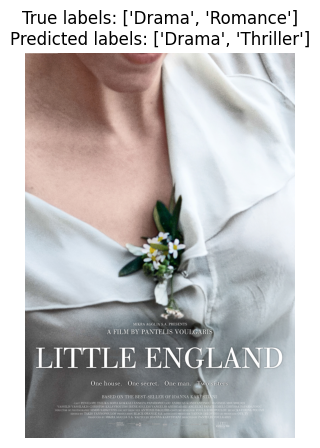

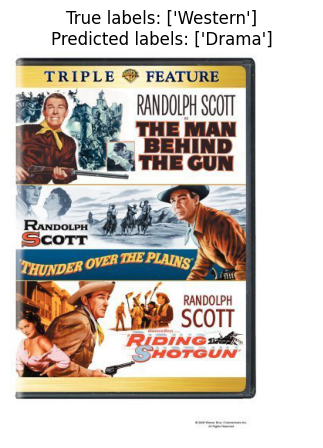

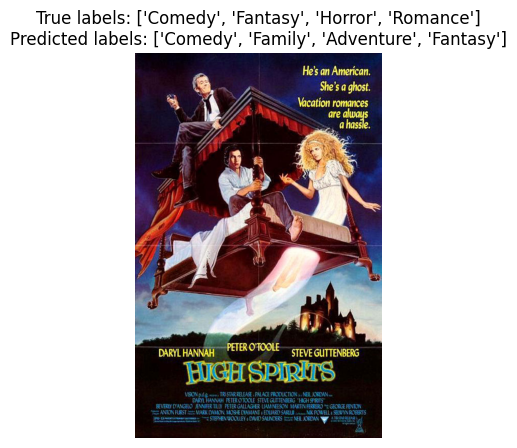

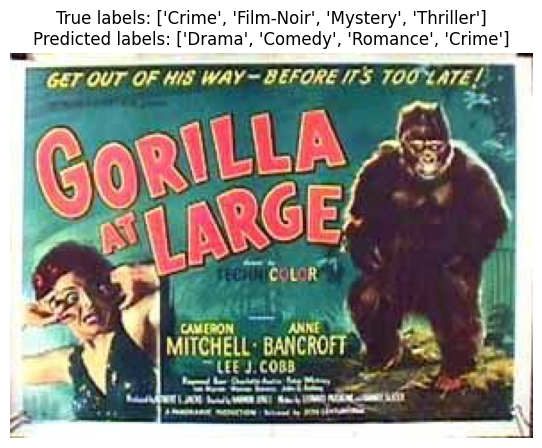

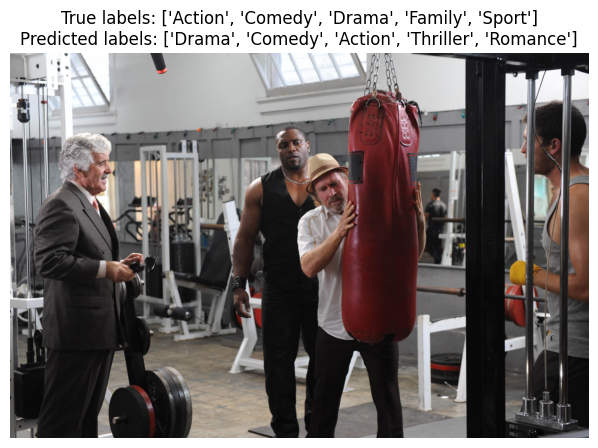

...

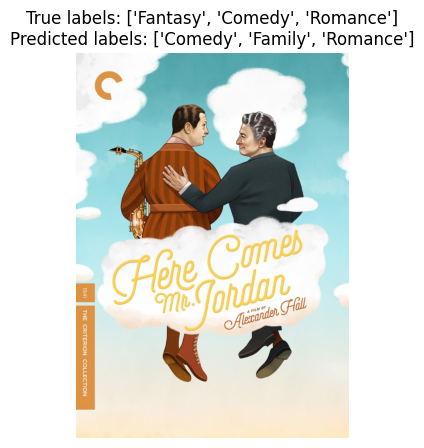

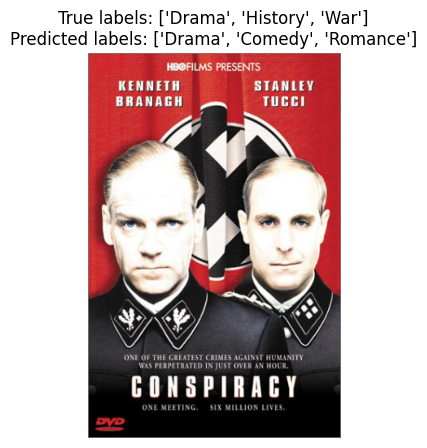

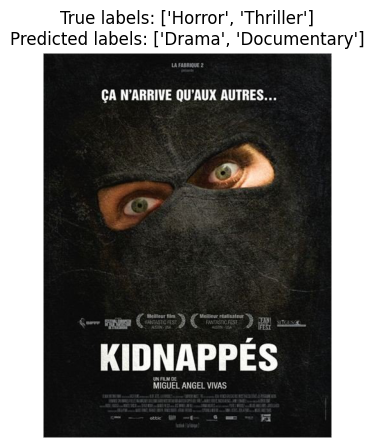

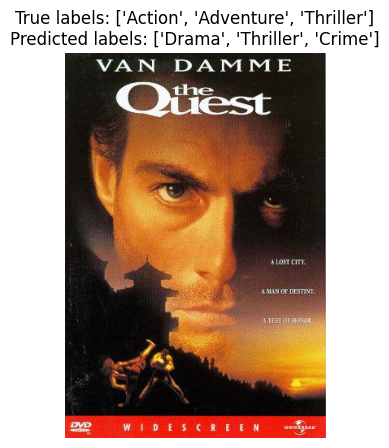

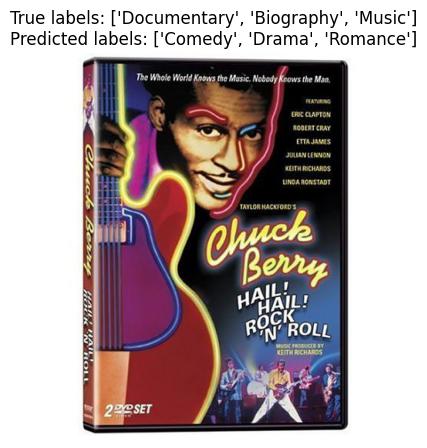

In [ ]:
import matplotlib.pyplot as plt
# Seleccionar 20 índices al azar
random_indices = random.sample(range(len(dataset_dict["test"])), 5)

# Para cada índice seleccionado al azar
for i in random_indices:
    # Obtener la entrada de prueba correspondiente
    entry = dataset_dict["test"][i]

    # Cargar la imagen original desde la ruta del archivo
    image = entry['image']

    # Obtener las etiquetas verdaderas
    true_labels = entry['labels']

    # Obtener las etiquetas predichas
    predicted_labels = top_labels_predicted[i]

    # Mostrar la imagen con las etiquetas verdaderas y las predichas
    plt.figure(figsize=(10, 5))
    plt.imshow(image)
    plt.title(f"True labels: {true_labels}\nPredicted labels: {predicted_labels}")
    plt.axis('off')
    plt.show()

In [ ]:
from sklearn.preprocessing import MultiLabelBinarizer

# Obtenemos las etiquetas verdaderas y convertimos a formato binario
mlb1 = MultiLabelBinarizer()
y_true = mlb1.fit_transform([entry['labels'] for entry in dataset_dict1["test"]])

# Obtenemos las etiquetas predichas y convertimos a formato binario
y_pred = mlb1.transform(top_labels_predicted)
# Calcular F1 
f1_sample = f1_score(y_true, y_pred, average='samples')
f1_macro = f1_score(y_true, y_pred, average='macro')
f1_weighted = f1_score(y_true, y_pred, average='weighted')
f1_micro = f1_score(y_true, y_pred, average='micro')
print("F1 score (samples_ConvNext):", f1_sample)
print("F1 score (macro_ConvNext):", f1_macro)
print("F1 score (weighted_ConvNext):", f1_weighted)
print("F1 score (micro_ConvNext):", f1_micro)

F1 score (samples_ConvNext): 0.43576176909510245
F1 score (macro_ConvNext): 0.2958505058078293
F1 score (weighted_ConvNext): 0.40610614478087137
F1 score (micro_ConvNext): 0.46705426356589147


In [ ]:
import pandas as pd
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score

# Initialize the lists that will hold the scores
f1_scores = []
precision_scores = []
recall_scores = []
error_rate_scores = []
accuracy_scores= []
# Obtain the list of genres
genres = mlb1.classes_

for i, genre in enumerate(genres):
    y_true_genre = y_true[:, i]
    y_pred_genre = y_pred[:, i]
    
    f1 = f1_score(y_true_genre, y_pred_genre)
    precision = precision_score(y_true_genre, y_pred_genre)
    recall = recall_score(y_true_genre, y_pred_genre)
    error_rate = 1 - precision  # Error rate is 1 minus the precision
    accuracy=accuracy_score(y_true_genre, y_pred_genre)
    # Add the scores to their respective lists
    f1_scores.append(f1)
    precision_scores.append(precision)
    recall_scores.append(recall)
    error_rate_scores.append(error_rate)
    accuracy_scores.append(accuracy)
# Create the DataFrame
df1 = pd.DataFrame({
    'Genre': genres,
    'F1': f1_scores,
    'Precision': precision_scores,
    'Recall': recall_scores,
    'Error Rate': error_rate_scores,
    'Accuracy': accuracy_scores
})

# Sort the DataFrame by F1 score in descending order
df1 = df1.sort_values(by='F1', ascending=False)

df1


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Genre,F1,Precision,Recall,Error Rate,Accuracy
7,Drama,0.694054,0.552496,0.933140,0.447504,0.596866
2,Animation,0.654867,0.770833,0.569231,0.229167,0.944444
4,Comedy,0.601533,0.481595,0.801020,0.518405,0.703704
5,Crime,0.538813,0.522124,0.556604,0.477876,0.856125
8,Family,0.529032,0.585714,0.482353,0.414286,0.896011
16,Romance,0.510264,0.462766,0.568627,0.537234,0.762108
20,Thriller,0.487952,0.383886,0.669421,0.616114,0.757835
0,Action,0.484536,0.494737,0.474747,0.505263,0.857550
9,Fantasy,0.414414,0.522727,0.343284,0.477273,0.907407
1,Adventure,0.385965,0.379310,0.392857,0.620690,0.850427


# 3. Build a zero-shot classification model based on CLIP
CLIP is a foundational image-text multimodal model that allows zero-shot learning https://
github.com/openai/CLIP. The idea is to use a pretrained model (eg. https://huggingface.
co/docs/transformers/model_doc/clip) to build a multilabel classification model for the MM-IMDB dataset. You do not need to fine tune the model, just use it to build your multi-
label classification model designing text queries for movie posters. Report the results on on both the training and test datasets.

In [ ]:
from transformers import CLIPModel, CLIPTokenizer

model_name = "openai/clip-vit-base-patch32"
tokenizer = CLIPTokenizer.from_pretrained(model_name)
model = CLIPModel.from_pretrained(model_name)

In [ ]:
genres_of_interest1={
    'Drama': 'A deeply emotional film dealing with serious themes',
    'Comedy': 'A funny film filled with humor and laughter',
    'Romance': 'A heartwarming love story between two characters',
    'Thriller': 'A suspenseful film full of tension and excitement',
    'Crime': 'A film centered around illegal activities and law enforcement',
    'Action': 'A film filled with excitement and adrenaline',
    'Adventure': 'A film showcasing a thrilling journey or quest',
    'Horror': 'A film designed to frighten and invoke fear',
    'Documentary': 'A factual film presenting information about real events',
    'Mystery': 'A film involving secrets, puzzles, or unknown events',
    'Sci-Fi': 'A film involving futuristic technology and space exploration',
    'Fantasy': 'A film filled with magical creatures and fantastical elements',
    'Family': 'A wholesome film suitable for all ages',
    'Biography': 'A film that tells the story of a real person\'s life',
    'War': 'A film portraying the tragedies and realities of war',
    'History': 'A film based on or recreating a historical event',
    'Music': 'A film centered around music, musicians, or musical performance',
    'Animation': 'A film created through drawing, computer graphics, or stop-motion',
    'Musical': 'A film where characters express themselves through song and dance',
    'Western': 'A film set in the American West, typically featuring cowboys',
    'Sport': 'A film centered around a competitive sport or athlete',
    'Short': 'A brief film, typically less than 30 minutes',
    'Film-Noir': 'A stylish, dark film primarily about crime and moral ambiguity'
}
text_descriptions = list(genres_of_interest1.values())
print(text_descriptions)
# tokenize
inputs = tokenizer(text_descriptions, padding=True, truncation=False, return_tensors="pt")

print(inputs)

['A deeply emotional film dealing with serious themes', 'A funny film filled with humor and laughter', 'A heartwarming love story between two characters', 'A suspenseful film full of tension and excitement', 'A film centered around illegal activities and law enforcement', 'A film filled with excitement and adrenaline', 'A film showcasing a thrilling journey or quest', 'A film designed to frighten and invoke fear', 'A factual film presenting information about real events', 'A film involving secrets, puzzles, or unknown events', 'A film involving futuristic technology and space exploration', 'A film filled with magical creatures and fantastical elements', 'A wholesome film suitable for all ages', "A film that tells the story of a real person's life", 'A film portraying the tragedies and realities of war', 'A film based on or recreating a historical event', 'A film centered around music, musicians, or musical performance', 'A film created through drawing, computer graphics, or stop-motion

Filter:   0%|          | 0/3274 [00:00<?, ? examples/s]

Filter:   0%|          | 0/3274 [00:00<?, ? examples/s]

Filter:   0%|          | 0/3274 [00:00<?, ? examples/s]

Filter:   0%|          | 0/3274 [00:00<?, ? examples/s]

Filter:   0%|          | 0/3274 [00:00<?, ? examples/s]

Filter:   0%|          | 0/3274 [00:00<?, ? examples/s]

Filter:   0%|          | 0/3274 [00:00<?, ? examples/s]

Filter:   0%|          | 0/3274 [00:00<?, ? examples/s]

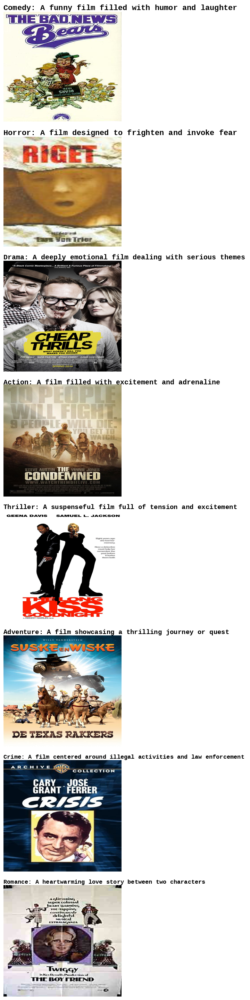

In [ ]:
from PIL import ImageDraw, ImageFont, Image
import random

def show_examples(dataset_dict, genres_of_interest, genres_of_interest1, seed: int = 1234, examples_per_class: int = 1, size=(350, 350), margin=10):
    w, h = size
    grid = Image.new('RGB', size=((examples_per_class+1) * (w+margin), len(genres_of_interest) * (h+margin)), color=(255, 255, 255))
    draw = ImageDraw.Draw(grid)
    max_font_size = 24
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationMono-Bold.ttf", max_font_size)

    for label_id, genre in enumerate(genres_of_interest):
        ds_slice = dataset_dict['train'].filter(lambda ex: genre in ex['labels']).shuffle(seed).select(range(examples_per_class))

        for i, example in enumerate(ds_slice):
            image = example['image']
            idx = examples_per_class * label_id + i
            text_position = ((idx % examples_per_class * (w+margin) + margin), (idx // examples_per_class * (h+margin) + margin))
            
            text = f"{genre}: {genres_of_interest1[genre]}"
            font_size = max_font_size
            while font.getsize(text)[0] > 2*w:
                font_size -= 1
                font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationMono-Bold.ttf", font_size)

            draw.text(text_position, text, (0, 0, 0), font=font)

            box = (text_position[0], text_position[1] + font.getsize(text)[1])
            image = image.resize((w-margin, h-margin-font.getsize(text)[1]))
            grid.paste(image, box=box)

    return grid

selected_genres =  {'Drama', 'Comedy', 'Romance', 'Thriller', 'Crime', 'Action', 'Adventure', 'Horror'}
show_examples(dataset_dict, selected_genres, genres_of_interest1, seed=random.randint(0, 1337), examples_per_class=1)


In [ ]:
import torch
from torchvision.transforms import Compose, Resize, CenterCrop, ToTensor, Normalize
from PIL import Image

def preprocess_images(dataset_dict):
    transform = Compose([
        Resize((224, 224)),  # CLIP fue entrenado con imágenes de tamaño 224x224
        ToTensor(),  # Convierte la imagen a tensor
        Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711)),  # Normalización utilizada en el entrenamiento de CLIP
    ])

    image_tensors = []

    for i in range(len(dataset_dict['test'])):
        image = dataset_dict['test']['image'][i]
        if isinstance(image, Image.Image):  # Comprueba que 'image' sea una instancia de Image.Image (PIL Image)
            image_tensor = transform(image)
            image_tensors.append(image_tensor)
        else:
            print(f"Skipping image at index {i} due to invalid format.")
    
    return torch.stack(image_tensors)  # Convierte la lista de tensores en un solo tensor


In [ ]:
image_tensors = preprocess_images(dataset_dict)

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  # Usa GPU si está disponible, de lo contrario usa CPU

model = model.to(device)
inputs = inputs.to(device)
image_tensors = image_tensors.to(device)

In [ ]:
# obtener las características de las descripciones de los géneros y las imágenes
with torch.no_grad():
    text_features = model.get_text_features(**inputs).float()
    image_features = model.get_image_features(image_tensors).float()



In [ ]:
# calcular la similitud entre las características de las imágenes y las descripciones de texto
logits_per_image =  image_features @ text_features.T



In [ ]:
probs_per_image = logits_per_image.softmax(dim=-1)

In [ ]:
# obtener las etiquetas de los géneros
genre_labels = list(genres_of_interest1.keys())

# para cada imagen, obtener los N géneros más probables, donde N es el número de géneros originales
predicted_genres = []
for i in range(len(dataset_dict['test'])):
    num_genres = len(dataset_dict['test']['labels'][i])
    top_genres = probs_per_image[i].topk(num_genres)
    predicted_genres.append([genre_labels[j.item()] for j in top_genres.indices])
   



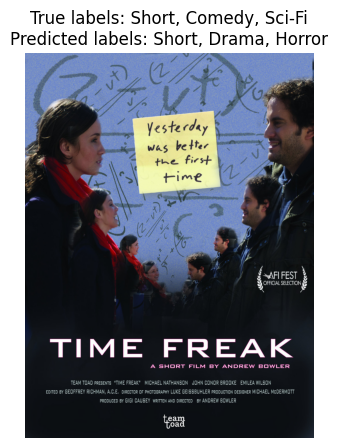

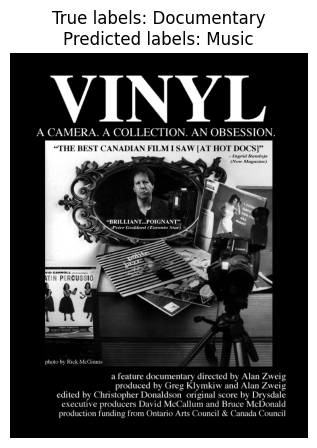

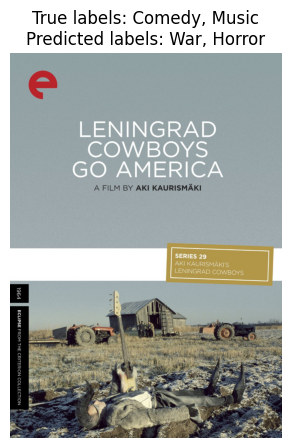

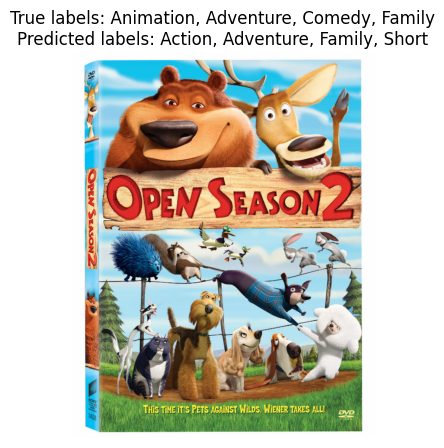

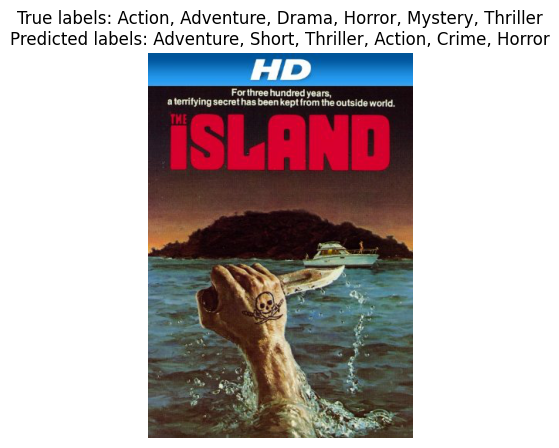

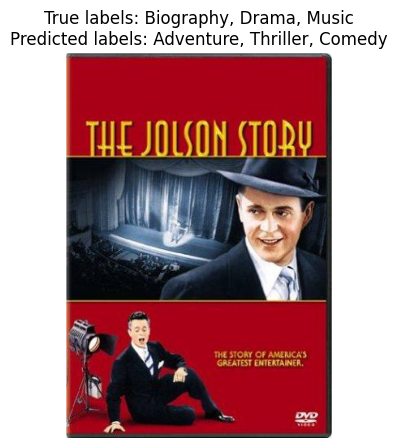

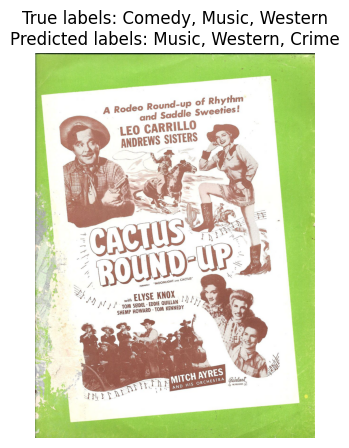

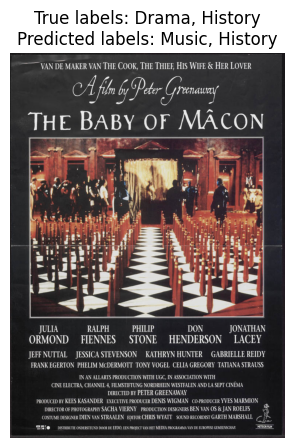

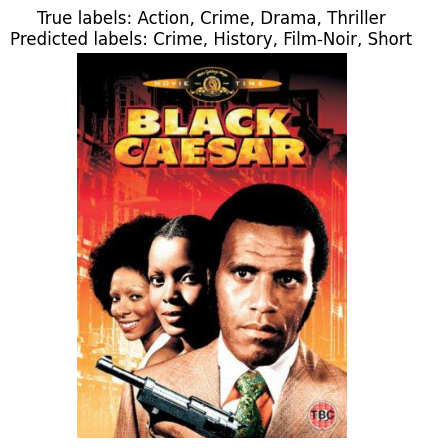

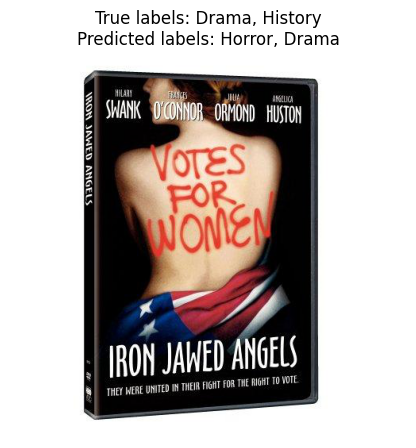

In [ ]:
import random
import matplotlib.pyplot as plt
from PIL import Image

# Seleccionar 5 índices al azar
random_indices = random.sample(range(len(dataset_dict["test"])), 10)

# Para cada índice seleccionado al azar
for i in random_indices:
    # Obtener la entrada de prueba correspondiente
    entry = dataset_dict["test"][i]

    # Cargar la imagen original desde la ruta del archivo
    image = entry['image']

    # Obtener las etiquetas verdaderas
    true_labels = entry['labels']

    # Obtener las etiquetas predichas
    predicted_labels = predicted_genres[i]

    # Mostrar la imagen con las etiquetas verdaderas y las predichas
    plt.figure(figsize=(10, 5))
    plt.imshow(image)
    plt.title(f"True labels: {', '.join(true_labels)}\nPredicted labels: {', '.join(predicted_labels)}")
    plt.axis('off')
    plt.show()


In [ ]:
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.metrics import f1_score
# Obtenemos las etiquetas verdaderas y convertimos a formato binario
mlb = MultiLabelBinarizer()
y_true = mlb.fit_transform([entry['labels'] for entry in dataset_dict["test"]])

# Obtenemos las etiquetas predichas y convertimos a formato binario
y_pred = mlb.transform(predicted_genres)

# Calcular F1 
f1_sample = f1_score(y_true, y_pred, average='samples')
f1_macro = f1_score(y_true, y_pred, average='macro')
f1_weighted = f1_score(y_true, y_pred, average='weighted')
f1_micro = f1_score(y_true, y_pred, average='micro')
print("F1 score (samples_clip):", f1_sample)
print("F1 score (macro_clip):", f1_macro)
print("F1 score (weighted_clip):", f1_weighted)
print("F1 score (micro_clip):", f1_micro)


F1 score (samples_clip): 0.32669800395122284
F1 score (macro_clip): 0.3028982661699646
F1 score (weighted_clip): 0.33282307902914765
F1 score (micro_clip): 0.3509272467902996


In [ ]:
import pandas as pd
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score
# Inicializamos las listas que contendrán los resultados
f1_scores = []
precision_scores = []
recall_scores = []
error_rate_scores = []
accuracy_scores = []

# Obtenemos la lista de géneros
genres = mlb.classes_

for i, genre in enumerate(genres):
    y_true_genre = y_true[:, i]
    y_pred_genre = y_pred[:, i]
    
    f1 = f1_score(y_true_genre, y_pred_genre)
    precision = precision_score(y_true_genre, y_pred_genre)
    recall = recall_score(y_true_genre, y_pred_genre)
    error_rate = 1 - precision  # Error rate is 1 minus the precision
    accuracy = accuracy_score(y_true_genre, y_pred_genre)
    
    # Añadimos los resultados a las listas
    f1_scores.append(f1)
    precision_scores.append(precision)
    recall_scores.append(recall)
    error_rate_scores.append(error_rate)
    accuracy_scores.append(accuracy)

# Creamos el DataFrame
df2 = pd.DataFrame({
    'Genre': genres,
    'F1': f1_scores,
    'Precision': precision_scores,
    'Recall': recall_scores,
    'Error Rate': error_rate_scores,
    'Accuracy': accuracy_scores
})

# Ordenamos el DataFrame por F1 de forma descendente
df2 = df2.sort_values(by='F1', ascending=False)

df2

,Genre,F1,Precision,Recall,Error Rate,Accuracy
19,Sport,0.519481,0.740741,0.400000,0.259259,0.947067
4,Comedy,0.503030,0.633588,0.417085,0.366412,0.765379
8,Family,0.496970,0.488095,0.506173,0.511905,0.881259
20,Thriller,0.481283,0.382979,0.647482,0.617021,0.722461
7,Drama,0.422311,0.675159,0.307246,0.324841,0.585122
0,Action,0.407767,0.381818,0.437500,0.618182,0.825465
5,Crime,0.402367,0.299559,0.612613,0.700441,0.711016
12,Horror,0.394366,0.373333,0.417910,0.626667,0.876967
1,Adventure,0.387879,0.271186,0.680851,0.728814,0.711016
22,Western,0.333333,0.909091,0.204082,0.090909,0.942775
